<a href="https://colab.research.google.com/github/BimalPatel2002/Twitter-Sentimental-Analysis/blob/main/Sentimental%20analysis%20of%20tweets(Twitter).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Installing and importing dependencies

In [ ]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


To fetch tweets from twitter, we need to install the tweepy library. We will be using this package to pull tweets on which our model will make predictions.

In [ ]:
!pip install tweepy

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing
import os
import tweepy as tw #for accessing Twitter API

#For Preprocessing
import re    # RegEx for removing non-letter characters
import nltk  #natural language processing
nltk.download("stopwords")
from nltk.corpus import stopwords
from nltk.stem.porter import *

# For Building the model
from sklearn.model_selection import train_test_split
import tensorflow as tf
import seaborn as sns
!pip install scikit-learn

#For data visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline

pd.options.plotting.backend = "plotly"

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


# Cleaning and prepping dataset

In [ ]:
# Load Tweet dataset
df1 = pd.read_csv('/content/drive/MyDrive/Mini_project_files/Reddit_Data.csv')
df1 = df1.rename(columns={'clean_comment': 'clean_text', 'category':'category'})
df1['category'] = df1['category'].map({-1: -1.0, 0: 0.0, 1:1.0})
# Output first five rows
df1.head()

,clean_text,category
0,family mormon have never tried explain them t...,1.0
1,buddhism has very much lot compatible with chr...,1.0
2,seriously don say thing first all they won get...,-1.0
3,what you have learned yours and only yours wha...,0.0
4,for your own benefit you may want read living ...,1.0


In [ ]:
# Load Tweet dataset
df2 = pd.read_csv('/content/drive/MyDrive/Mini_project_files/apple-twitter-sentiment-texts.csv')
df2 = df2.rename(columns={'text': 'clean_text', 'sentiment':'category'})
df2['category'] = df2['category'].map({-1: -1.0, 0: 0.0, 1:1.0})
# Output first five rows

df2.head()

,clean_text,category
0,Wow. Yall needa step it up @Apple RT @heynyla:...,-1.0
1,What Happened To Apple Inc? http://t.co/FJEX...,0.0
2,Thank u @apple I can now compile all of the pi...,1.0
3,The oddly uplifting story of the Apple co-foun...,0.0
4,@apple can i exchange my iphone for a differen...,0.0


In [ ]:
# Load Tweet dataset
df3 = pd.read_csv('/content/drive/MyDrive/Mini_project_files/finalSentimentdata.csv')
df3 = df3.rename(columns={'text': 'clean_text', 'sentiment':'category'})
df3['category'] = df3['category'].map({'sad': -1.0, 'anger': -1.0, 'fear': -1.0, 'joy':1.0})
df3 = df3.drop(['Unnamed: 0'], axis=1)
# Output first five rows
df3.head()

,category,clean_text
0,-1.0,agree the poor in india are treated badly thei...
1,1.0,if only i could have spent the with this cutie...
2,1.0,will nature conservation remain a priority in ...
3,-1.0,coronavirus disappearing in italy show this to...
4,-1.0,uk records lowest daily virus death toll since...


In [ ]:
# Load Tweet dataset
df4 = pd.read_csv('/content/drive/MyDrive/Mini_project_files/Tweets.csv')
df4 = df4.rename(columns={'text': 'clean_text', 'sentiment':'category'})
df4['category'] = df4['category'].map({'negative': -1.0, 'neutral': 0.0, 'positive':1.0})
df4 = df4[['category','clean_text']]
# Output first five rows
df4.head()

,category,clean_text
0,0.0,"I`d have responded, if I were going"
1,-1.0,Sooo SAD I will miss you here in San Diego!!!
2,-1.0,my boss is bullying me...
3,-1.0,what interview! leave me alone
4,-1.0,"Sons of ****, why couldn`t they put them on t..."


In [ ]:
# Load ChatGpt dataset
df5 = pd.read_csv('/content/drive/MyDrive/Mini_project_files/chatgpt_sentiment.csv')
df5 = df5.rename(columns={'tweets': 'clean_text', 'labels':'category'})
df5['category'] = df5['category'].map({'bad': -1.0, 'neutral': 0.0, 'good':1.0})
df5 = df5.drop(['Unnamed: 0'], axis=1)
# Output first five rows
df5.head()

,clean_text,category
0,ChatGPT: Optimizing Language Models for Dialog...,0.0
1,"Try talking with ChatGPT, our new AI system wh...",1.0
2,ChatGPT: Optimizing Language Models for Dialog...,0.0
3,"THRILLED to share that ChatGPT, our new model ...",1.0
4,"As of 2 minutes ago, @OpenAI released their ne...",-1.0


In [ ]:
# Load tweets dataset
df6 = pd.read_csv('/content/drive/MyDrive/Mini_project_files/Twitter_Data.csv')
# Output first five rows
df6.head()

,clean_text,category
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0


In [ ]:
df = pd.concat([df1, df2, df3, df4, df5, df6], ignore_index=True)
# df = pd.concat([df1, df2, df3, df4, df5], ignore_index=True)
print(df.head)

<bound method NDFrame.head of                                                clean_text  category
0        family mormon have never tried explain them t...       1.0
1       buddhism has very much lot compatible with chr...       1.0
2       seriously don say thing first all they won get...      -1.0
3       what you have learned yours and only yours wha...       0.0
4       for your own benefit you may want read living ...       1.0
...                                                   ...       ...
451719  why these 456 crores paid neerav modi not reco...      -1.0
451720  dear rss terrorist payal gawar what about modi...      -1.0
451721  did you cover her interaction forum where she ...       0.0
451722  there big project came into india modi dream p...       0.0
451723  have you ever listen about like gurukul where ...       1.0

[451724 rows x 2 columns]>


In [ ]:
# Check for missing data
df.isnull().sum()

clean_text    105
category        7
dtype: int64

In [ ]:
# drop missing rows
df.dropna(axis=0, inplace=True)

In [ ]:
# dimensionality of the data
df.shape

(451612, 2)

In [ ]:
# Map tweet categories
df['category'] = df['category'].map({-1.0:'Negative', 0.0:'Neutral', 1.0:'Positive'})

# Output first five rows
print(df)
df.tail(7)

                                               clean_text  category
0        family mormon have never tried explain them t...  Positive
1       buddhism has very much lot compatible with chr...  Positive
2       seriously don say thing first all they won get...  Negative
3       what you have learned yours and only yours wha...   Neutral
4       for your own benefit you may want read living ...  Positive
...                                                   ...       ...
451719  why these 456 crores paid neerav modi not reco...  Negative
451720  dear rss terrorist payal gawar what about modi...  Negative
451721  did you cover her interaction forum where she ...   Neutral
451722  there big project came into india modi dream p...   Neutral
451723  have you ever listen about like gurukul where ...  Positive

[451612 rows x 2 columns]


,clean_text,category
451717,modi promised 2014 lok sabha elections that be...,Positive
451718,save your agenda peddling ’ had with terror at...,Neutral
451719,why these 456 crores paid neerav modi not reco...,Negative
451720,dear rss terrorist payal gawar what about modi...,Negative
451721,did you cover her interaction forum where she ...,Neutral
451722,there big project came into india modi dream p...,Neutral
451723,have you ever listen about like gurukul where ...,Positive


# Data Visualisation

In [ ]:
# The distribution of sentiments
df.groupby('category').count().plot(kind='bar')

In [ ]:
# Calculate tweet lengths
tweet_len = pd.Series([len(tweet.split()) for tweet in df['clean_text']])

# The distribution of tweet text lengths
tweet_len.plot(kind='box')

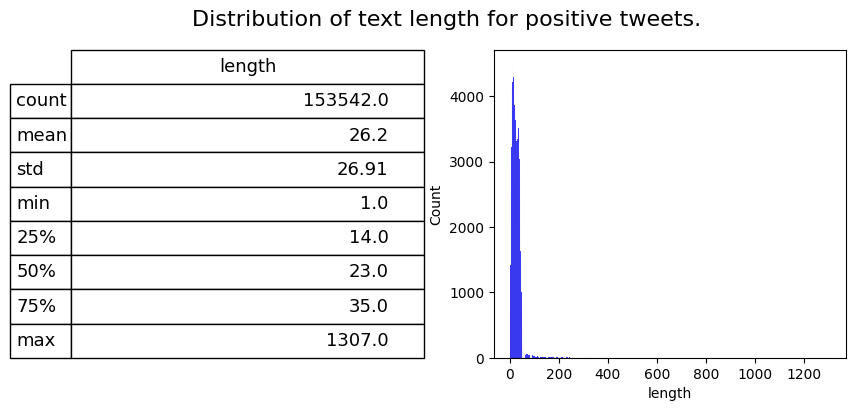

In [ ]:
fig = plt.figure(figsize=(10,4))
df['length'] = df.clean_text.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(df[df['category']=='Positive']['length'], ax=ax1,color='Blue')
describe = df.length[df.category=='Positive'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 13
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for positive tweets.', fontsize=16)

plt.show()

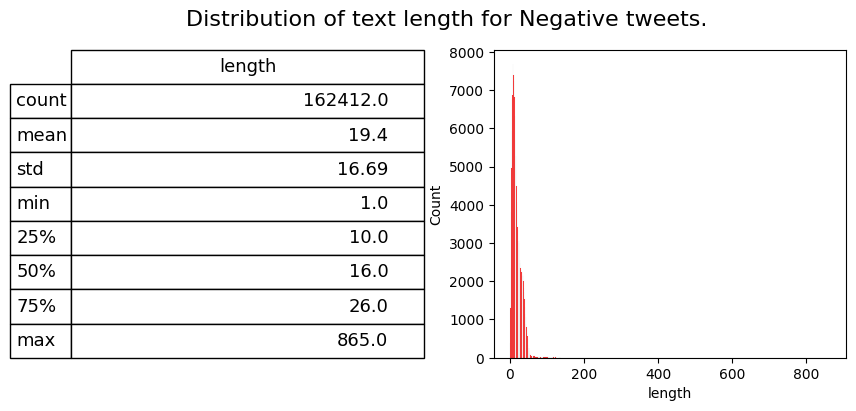

In [ ]:
fig = plt.figure(figsize=(10,4))
df['length'] = df.clean_text.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(df[df['category']=='Negative']['length'], ax=ax1,color='red')
describe = df.length[df.category=='Negative'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 13
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for Negative tweets.', fontsize=16)

plt.show()

Plotting the Pie chart of the percentage of different sentiments of all the tweets

In [ ]:
import plotly.express as px
fig = px.pie(df, names='category', title ='Pie chart of different sentiments of tweets')
fig.show()

In [ ]:
df.drop(['length'], axis=1, inplace=True)
df.head

<bound method NDFrame.head of                                                clean_text  category
0        family mormon have never tried explain them t...  Positive
1       buddhism has very much lot compatible with chr...  Positive
2       seriously don say thing first all they won get...  Negative
3       what you have learned yours and only yours wha...   Neutral
4       for your own benefit you may want read living ...  Positive
...                                                   ...       ...
451719  why these 456 crores paid neerav modi not reco...  Negative
451720  dear rss terrorist payal gawar what about modi...  Negative
451721  did you cover her interaction forum where she ...   Neutral
451722  there big project came into india modi dream p...   Neutral
451723  have you ever listen about like gurukul where ...  Positive

[451612 rows x 2 columns]>

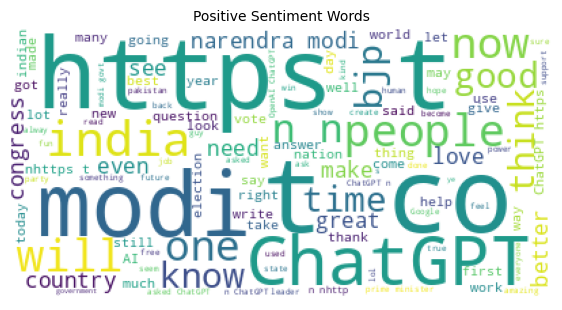

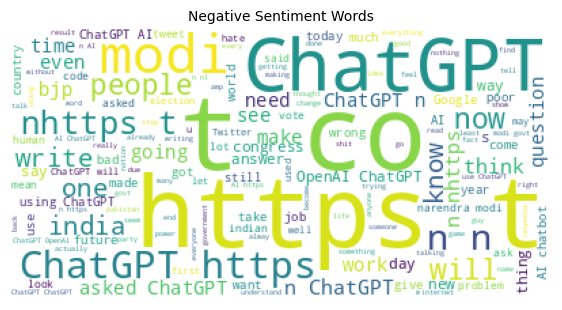

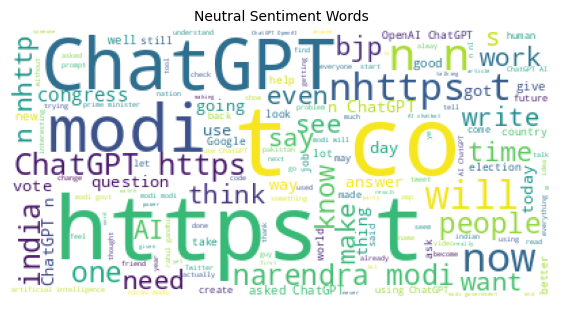

In [ ]:
#### Visualizing data into wordclouds

from wordcloud import WordCloud, STOPWORDS

def wordcount_gen(df, category):
    '''
    Generating Word Cloud
    inputs:
       - df: tweets dataset
       - category: Positive/Negative/Neutral
    '''
    # Combine all tweets
    combined_tweets = " ".join([tweet for tweet in df[df.category==category]['clean_text']])

    # Initialize wordcloud object
    wc = WordCloud(background_color='white',
                   max_words=150,
                   stopwords = STOPWORDS)

    # Generate and plot wordcloud
    plt.figure(figsize=(7,7))
    plt.imshow(wc.generate(combined_tweets))
    plt.title('{} Sentiment Words'.format(category), fontsize=10)
    plt.axis('off')
    plt.show()

# Positive tweet words
wordcount_gen(df, 'Positive')

# Negative tweet words
wordcount_gen(df, 'Negative')

# Neutral tweet words
wordcount_gen(df, 'Neutral')



# Data Preprocessing

In [ ]:
def tweet_to_words(tweet):
    ''' Convert tweet text into a sequence of words '''

    # convert to lowercase
    text = tweet.lower()
    # remove non letters
    text = re.sub(r"[^a-zA-Z0-9]", " ", text)
    # tokenize
    words = text.split()
    # remove stopwords
    words = [w for w in words if w not in stopwords.words("english")]
    # apply stemming
    words = [PorterStemmer().stem(w) for w in words]
    # return list
    return words

print("\nOriginal tweet ->", df['clean_text'][0])
print("\nProcessed tweet ->", tweet_to_words(df['clean_text'][0]))


Original tweet ->  family mormon have never tried explain them they still stare puzzled from time time like some kind strange creature nonetheless they have come admire for the patience calmness equanimity acceptance and compassion have developed all the things buddhism teaches 

Processed tweet -> ['famili', 'mormon', 'never', 'tri', 'explain', 'still', 'stare', 'puzzl', 'time', 'time', 'like', 'kind', 'strang', 'creatur', 'nonetheless', 'come', 'admir', 'patienc', 'calm', 'equanim', 'accept', 'compass', 'develop', 'thing', 'buddhism', 'teach']


In [ ]:
# Apply data processing to each tweet
X = list(map(tweet_to_words, df['clean_text']))

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Encode target labels
le = LabelEncoder()
Y = le.fit_transform(df['category'])

In [ ]:
# label 2 is applied on positive tweets.
print(X[0])
print(Y[0])

[ 307   26  160  309  528   95   39  127   31   62   62   34   65  454
 2931   39   26  165   10    1    3   26 1055   32    1  170    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0]
2


In [ ]:
print(X[4])
print(Y[4])

[3476  144 2178   40   56 1831 2519 1669   19   95  116   16  175   66
  708  187   39  175  247    1  106  417 4385   66 4931  175  179 2980
   95    1  261  465 1317 1830   21 4907  624   19   40  849 4548  146
   39  329   13   26   83   40  210  116]
2


In [ ]:
# label 0 is applied on negative tweets.
print(X[2])
print(Y[2])

['serious', 'say', 'thing', 'first', 'get', 'complex', 'explain', 'normal', 'peopl', 'anyway', 'dogmat', 'matter', 'say', 'see', 'mechant', 'post', 'reason', 'decid', 'later', 'life', 'move', 'buddhism', 'suit', 'ident', 'though', 'still', 'get', 'keep', 'wisdom', 'famili', 'treat', 'like', 'went', 'weird', 'hippi', 'phase', 'didncha', 'never', 'hear', 'end', 'pro', 'tip', 'put', 'one', 'wall', 'jpg']
0


### Train and test split

In [ ]:
y = pd.get_dummies(df['category'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

### Bag of words (BOW) feature extraction

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
#from sklearn.feature_extraction.text import TfidfVectorizer

vocabulary_size = 5000

# Tweets have already been preprocessed hence dummy function will be passed in
# to preprocessor & tokenizer step
count_vector = CountVectorizer(max_features=vocabulary_size,
#                               ngram_range=(1,2),    # unigram and bigram
                                preprocessor=lambda x: x,
                               tokenizer=lambda x: x)
#tfidf_vector = TfidfVectorizer(lowercase=True, stop_words='english')

# Fit the training data
X_train = count_vector.fit_transform(X_train).toarray()

# Transform testing data
X_test = count_vector.transform(X_test).toarray()

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



In [ ]:
#import sklearn.preprocessing as pr

# Normalize BoW features in training and test set
#X_train = pr.normalize(X_train, axis=1)
#X_test  = pr.normalize(X_test, axis=1)

In [ ]:
# print first 200 words/tokens
from sklearn.feature_extraction.text import CountVectorizer
print(count_vector.get_feature_names_out()[0:200])

['0' '00' '000' '003' '1' '10' '100' '1000' '10000' '100daysofcod' '101'
 '10x' '11' '1145' '12' '12000' '125' '13' '130' '14' '15' '150' '15l'
 '15lakh' '16' '17' '18' '19' '1947' '1971' '1980' '1984' '1m' '1st' '2'
 '20' '200' '2000' '2002' '2004' '2007' '2008' '2009' '2010' '2011' '2012'
 '2013' '2014' '2015' '2016' '2017' '2018' '2019' '2020' '2021' '2022'
 '2023' '2024' '2030' '21' '21st' '22' '23' '23rd' '24' '25' '250' '2611'
 '2nd' '3' '30' '300' '350' '35a' '370' '3d' '3rd' '4' '40' '400' '4000'
 '45' '4th' '5' '50' '500' '5000' '5th' '5year' '5yr' '6' '60' '600'
 '6000' '6th' '6usdt' '7' '70' '72000' '72k' '7th' '8' '80' '9' '90' '95'
 '99' 'aadhaar' 'aadhar' 'aaj' 'aam' 'aap' 'aapl' 'aayog' 'abandon'
 'abdullah' 'abe' 'abhi' 'abhinandan' 'abil' 'abki' 'abl' 'abolish'
 'abroad' 'absolut' 'abstract' 'absurd' 'abt' 'abus' 'abv' 'academ'
 'academia' 'academictwitt' 'acceler' 'accent' 'accept' 'access' 'acch'
 'accid' 'accident' 'accomplish' 'accord' 'account' 'accumul' 'accur'
 

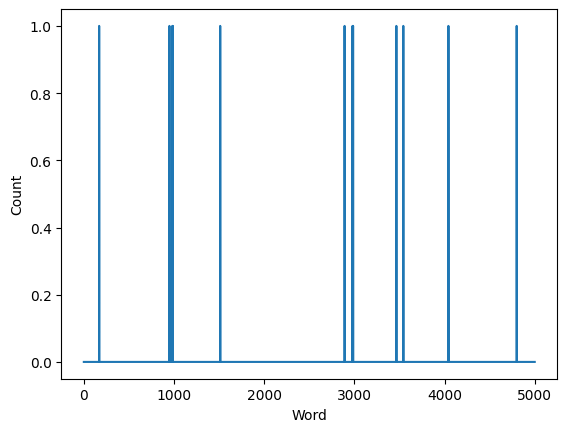

In [ ]:
# Plot the BoW feature vector
plt.plot(X_train[2,:])
plt.xlabel('Word')
plt.ylabel('Count')
plt.show()

### Tokenizing & Padding

In [ ]:
!pip install keras
import keras
from keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.utils import pad_sequences

max_words = 5000
max_len=50

def tokenize_pad_sequences(text):
    # Text tokenization
    tokenizer = Tokenizer(num_words=max_words, lower=True, split=' ')
    tokenizer.fit_on_texts(text)
    # Transforms text to a sequence of integers
    X = tokenizer.texts_to_sequences(text)
    # Pad sequences to the same length
    X = pad_sequences(X, padding='post', maxlen=max_len)
    # return sequences
    return X, tokenizer

print('Before Tokenization & Padding: \n', df['clean_text'][0])
X, tokenizer = tokenize_pad_sequences(df['clean_text'])
print('After Tokenization & Padding: \n', X[0])

Before Tokenization & Padding: 
  family mormon have never tried explain them they still stare puzzled from time time like some kind strange creature nonetheless they have come admire for the patience calmness equanimity acceptance and compassion have developed all the things buddhism teaches 
After Tokenization & Padding: 
 [ 307   26  160  309  528   95   39  127   31   62   62   34   65  454
 2931   39   26  165   10    1    3   26 1055   32    1  170    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0]


### Saving tokenized data

In [ ]:
import pickle

# saving
with open('tokenizer.pickle', 'wb') as handle:
    pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)

# loading
with open('tokenizer.pickle', 'rb') as handle:
    tokenizer = pickle.load(handle)

### Train & Test Split

In [ ]:
y = pd.get_dummies(df['category'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)
print('Train Set ->', X_train.shape, y_train.shape)
print('Validation Set ->', X_val.shape, y_val.shape)
print('Test Set ->', X_test.shape, y_test.shape)

Train Set -> (270966, 50) (270966, 3)
Validation Set -> (90323, 50) (90323, 3)
Test Set -> (90323, 50) (90323, 3)


In [ ]:
import keras.backend as K

def f1_score(precision, recall):
    ''' Function to calculate f1 score '''

    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

# Bidirectional LSTM Using NN (Sequential model using convolutional neural network)



In [ ]:
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, MaxPooling1D, Bidirectional, LSTM, Dense, Dropout
from keras.metrics import Precision, Recall
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras import datasets
from keras.callbacks import LearningRateScheduler
from keras.callbacks import History
from keras import losses

vocab_size = 5000
embedding_size = 32
epochs=20
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
# Build model
model= Sequential()
model.add(Embedding(vocab_size, embedding_size, input_length=max_len))
model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Bidirectional(LSTM(32)))
model.add(Dropout(0.4))
model.add(Dense(3, activation='softmax'))

/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/gradient_descent.py:114: UserWarning:

The `lr` argument is deprecated, use `learning_rate` instead.



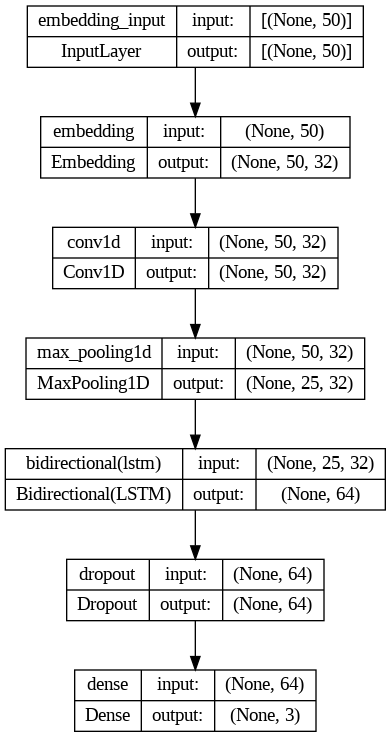

In [ ]:
import tensorflow as tf
tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
print(model.summary())

# Compile model
model.compile(loss='categorical_crossentropy', optimizer=sgd,
               metrics=['accuracy', Precision(), Recall()])

# Train model
batch_size = 64
history = model.fit(X_train, y_train,
                      validation_data=(X_val, y_val),
                      batch_size=batch_size, epochs=epochs, verbose=1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 50, 32)            160000    
                                                                 
 conv1d (Conv1D)             (None, 50, 32)            3104      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 25, 32)           0         
 )                                                               
                                                                 
 bidirectional (Bidirectiona  (None, 64)               16640     
 l)                                                              
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense (Dense)               (None, 3)                 1

In [ ]:
# Evaluate model on the test set
loss, accuracy, precision, recall = model.evaluate(X_test, y_test, verbose=0)
# Print metrics
print('')
print('Accuracy  : {:.4f}'.format(accuracy))
print('Precision : {:.4f}'.format(precision))
print('Recall    : {:.4f}'.format(recall))
print('F1 Score  : {:.4f}'.format(f1_score(precision, recall)))


Accuracy  : 0.8318
Precision : 0.8485
Recall    : 0.8127
F1 Score  : 0.8302


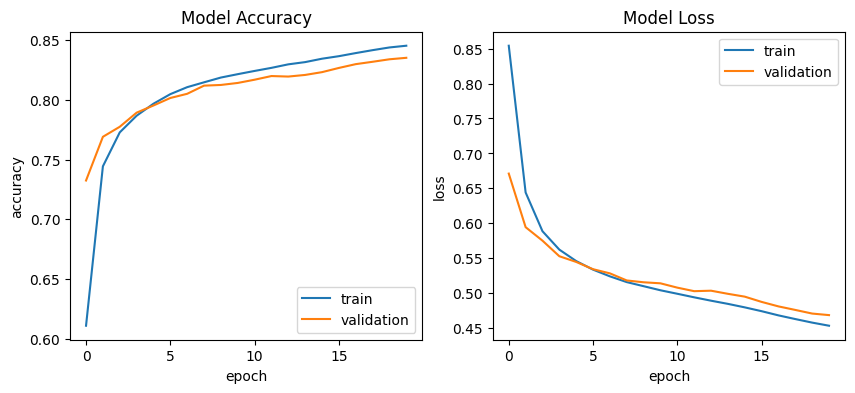

In [ ]:
def plot_training_hist(history):
    '''Function to plot history for accuracy and loss'''

    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    # first plot
    ax[0].plot(history.history['accuracy'])
    ax[0].plot(history.history['val_accuracy'])
    ax[0].set_title('Model Accuracy')
    ax[0].set_xlabel('epoch')
    ax[0].set_ylabel('accuracy')
    ax[0].legend(['train', 'validation'], loc='best')
    # second plot
    ax[1].plot(history.history['loss'])
    ax[1].plot(history.history['val_loss'])
    ax[1].set_title('Model Loss')
    ax[1].set_xlabel('epoch')
    ax[1].set_ylabel('loss')
    ax[1].legend(['train', 'validation'], loc='best')

plot_training_hist(history)

Model Confusion Matrix

2823/2823 [==============================] - 46s 15ms/step


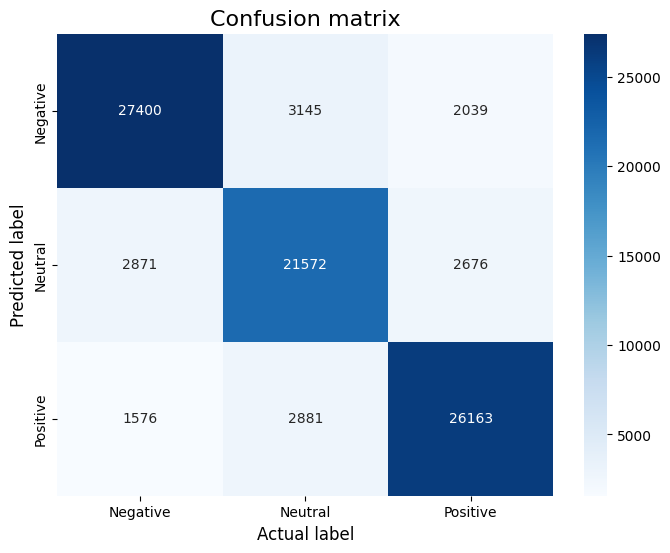

In [ ]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, X_test, y_test):
    '''Function to plot confusion matrix for the passed model and the data'''

    sentiment_classes = ['Negative', 'Neutral', 'Positive']
    # use model to do the prediction
    y_pred = model.predict(X_test)
    # compute confusion matrix
    cm = confusion_matrix(np.argmax(np.array(y_test),axis=1), np.argmax(y_pred, axis=1))
    # plot confusion matrix
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, cmap=plt.cm.Blues, annot=True, fmt='d',
                xticklabels=sentiment_classes,
                yticklabels=sentiment_classes)
    plt.title('Confusion matrix', fontsize=16)
    plt.xlabel('Actual label', fontsize=12)
    plt.ylabel('Predicted label', fontsize=12)

plot_confusion_matrix(model, X_test, y_test)

Model save and load for the prediction

In [ ]:
# Save the model architecture & the weights
model.save('best_model.h5')
print('Best model saved')

Best model saved


In [ ]:
from keras.models import load_model

# Load model
model = load_model('best_model.h5')

def predict_class(text):
    '''Function to predict sentiment class of the passed text'''

    sentiment_classes = ['Negative', 'Neutral', 'Positive']
    max_len=50

    # Transforms text to a sequence of integers using a tokenizer object
    xt = tokenizer.texts_to_sequences(text)
    # Pad sequences to the same length
    xt = pad_sequences(xt, padding='post', maxlen=max_len)
    # Do the prediction using the loaded model
    yt = model.predict(xt).argmax(axis=1)
    # Print the predicted sentiment
    print('The predicted sentiment is', sentiment_classes[yt[0]])

In [ ]:
predict_class(['"I hate when I have to call and wake people up'])

1/1 [==============================] - 1s 848ms/step
The predicted sentiment is Negative


In [ ]:
predict_class(['The food was meh'])

1/1 [==============================] - 0s 24ms/step
The predicted sentiment is Neutral


In [ ]:
predict_class(['He is a best minister india ever had seen'])

1/1 [==============================] - 0s 27ms/step
The predicted sentiment is Positive


Fetching data from twitter

In [ ]:
#Getting authorization
consumer_key= 'kLjgc5dnY5eBvupQsXClihaT1'
consumer_secret= 'EYJ0aLa5bpmeBf35RCbLnBGslvWUS6mZ12jOD2CrA3jY7MkHyD'
access_token= '966598777661304833-5ygIRK6r7SZw1wn63jKAGPzkz1tuxuq'
access_token_secret= 'yk2RFB6euBe08vh5bNGsKS30Wpq7uZAntXBkyPTTnwIjZ'

auth = tw.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tw.API(auth, wait_on_rate_limit=True)

1. Searching for a hashtag from a specified date

In [ ]:
# Define the search term and the date_since date as variables
search_words = "#WorkFromHome"
date_since = "2021-06-10"

In [ ]:
# Collect tweets
tweets = tw.Cursor(api.search_tweets,
              q=search_words,
              lang="en",
              since=date_since).items(10)

# Iterate and print tweets
for tweet in tweets:
    print(tweet.text)
    predict_class([tweet.text]) #predicting sentiment
    print("")

2. Searching for a keyword

In [ ]:
for tweet in api.search_tweets(q="elonmusk", lang="en", rpp=10):
    print(f"{tweet.user.name}:{tweet.text}")
    predict_class([tweet.text]) #predicting sentiment
    print("")

3. Searching for a username

In [ ]:
posts = api.user_timeline(screen_name="elonmusk", count = 10, lang ="en", tweet_mode="extended")

l=[]
i=1

for tweet in posts[:10]:
    l.append(tweet.full_text)
    i=i+1
for j in range (0,9):
    print(l[j])
    predict_class([l[j]])  #predicting sentiment
    print("\n")